Following the guide here: https://learn.astropy.org/tutorials/FITS-images.html with data from https://chandra.harvard.edu/photo/openFITS/ 

In [1]:
import numpy as np

# Set up matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

from astropy.io import fits

In [2]:
#soft, medium and hard X-ray bands
# image_file = 'casa_0.5-1.5keV.fits'
# image_file = 'casa_1.5-3.0keV.fits'
image_file = 'casa_4.0-6.0keV.fits'

In [3]:
hdu_list = fits.open(image_file)
hdu_list.info()

Filename: casa_4.0-6.0keV.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      26   (1024, 1024)   float32   


In [4]:
image_data = hdu_list[0].data

In [5]:
print(type(image_data))
print(image_data.shape)

<class 'numpy.ndarray'>
(1024, 1024)


In [6]:
hdu_list.close()

In [7]:
image_data = fits.getdata(image_file)
print(type(image_data))
print(image_data.shape)

<class 'numpy.ndarray'>
(1024, 1024)


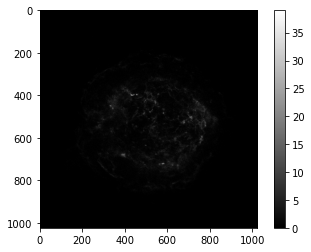

In [8]:
plt.imshow(image_data, cmap='gray')
plt.colorbar()

In [9]:
print('Min:', np.min(image_data))
print('Max:', np.max(image_data))
print('Mean:', np.mean(image_data))
print('Stdev:', np.std(image_data))

Min: 0.0
Max: 39.0
Mean: 0.37574768
Stdev: 1.0736147


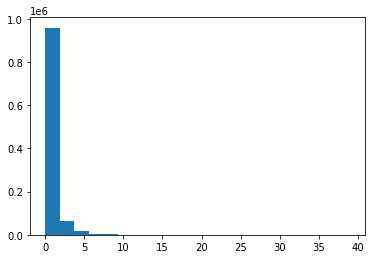

In [10]:
histogram = plt.hist(image_data.flatten(), bins='auto')

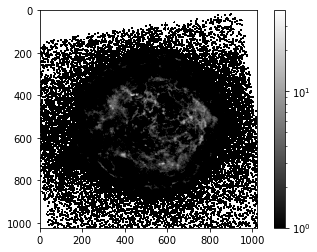

In [11]:
from matplotlib.colors import LogNorm
plt.imshow(image_data, cmap='gray', norm=LogNorm())
plt.colorbar()

Stacking Attempt

In [12]:
image_list = ['casa_0.5-1.5keV.fits','casa_1.5-3.0keV.fits','casa_4.0-6.0keV.fits']
image_concat = [fits.getdata(image) for image in image_list]


In [13]:
np.max(image_concat[0])


207.0

In [14]:
final_image = np.zeros(shape=image_concat[0].shape)

for image in image_concat:
    final_image += image

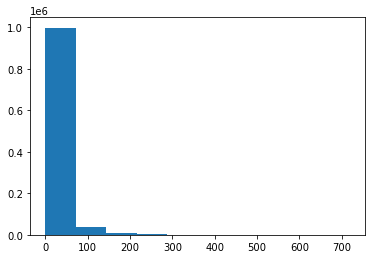

In [15]:
image_hist = plt.hist(final_image.flatten())

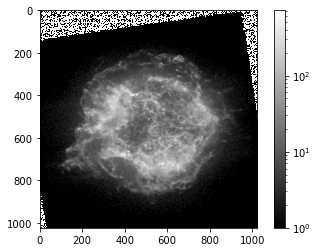

In [16]:
plt.imshow(final_image, cmap='gray', norm=LogNorm())
plt.colorbar()
plt.savefig('casa_unfiltered_final.jpg')

Side by side different wavelengths

0.5-1.5 keV, 1.5-3.0keV, 4.0-6.0 keV, Superposition of All

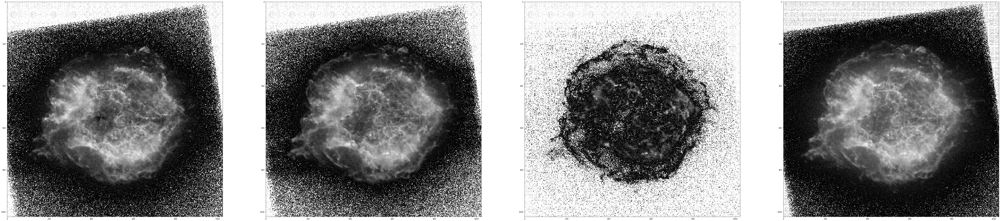

In [17]:
fig, axs = plt.subplots(1,4, figsize = (100, 100))
axs[0].imshow(image_concat[0], cmap='gray', norm=LogNorm())
axs[1].imshow(image_concat[1], cmap='gray', norm=LogNorm())
axs[2].imshow(image_concat[2], cmap='gray', norm=LogNorm())
axs[3].imshow(final_image, cmap='gray', norm=LogNorm())
plt.savefig('casa_unfiltered.jpg')
plt.show()


Applying some steps form here: https://chandra.harvard.edu/photo/openFITS/casa.html

Smoothing

In [18]:
from skimage import data
from skimage.morphology import disk
from skimage.filters import median
image_concat_smooth = [median(fits.getdata(image), disk(5)) for image in image_list]


In [19]:
final_image_smooth = np.zeros(shape=image_concat[0].shape)

for image in image_concat_smooth:
    final_image_smooth += image

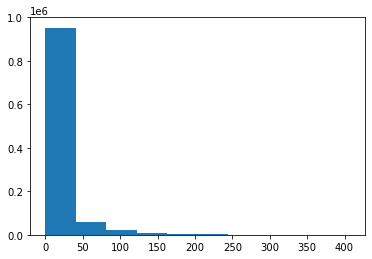

In [20]:
image_hist = plt.hist(final_image_smooth.flatten())

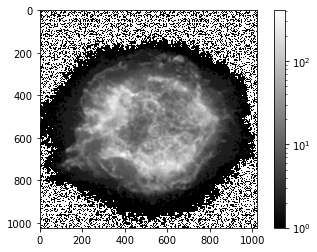

In [21]:
plt.imshow(final_image_smooth, cmap='gray', norm=LogNorm())
plt.colorbar()
plt.savefig('casa_filtered_final.jpg')

Side by side different wavelengths

0.5-1.5 keV, 1.5-3.0keV, 4.0-6.0 keV, Superposition of All

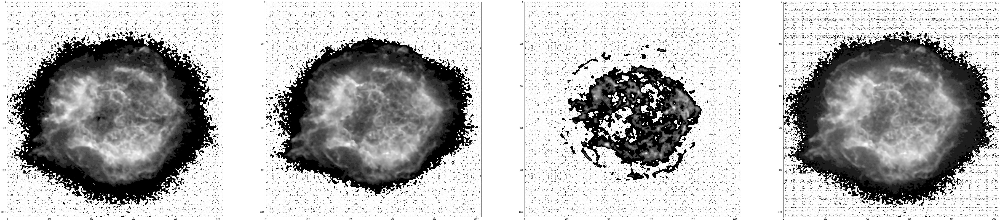

In [22]:
fig, axs = plt.subplots(1,4, figsize = (100, 100))
axs[0].imshow(image_concat_smooth[0], cmap='gray', norm=LogNorm())
axs[1].imshow(image_concat_smooth[1], cmap='gray', norm=LogNorm())
axs[2].imshow(image_concat_smooth[2], cmap='gray', norm=LogNorm())
axs[3].imshow(final_image_smooth, cmap='gray', norm=LogNorm())
plt.savefig('casa_filtered.jpg')
plt.show()


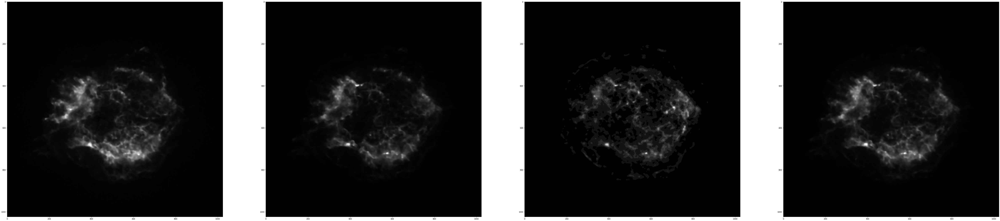

In [23]:
fig, axs = plt.subplots(1,4, figsize = (100, 100))
axs[0].imshow(image_concat_smooth[0], cmap='gray')#, norm=LogNorm())
axs[1].imshow(image_concat_smooth[1], cmap='gray')#, norm=LogNorm())
axs[2].imshow(image_concat_smooth[2], cmap='gray')#, norm=LogNorm())
axs[3].imshow(final_image_smooth, cmap='gray')#, norm=LogNorm())
plt.savefig('casa_filtered_normalscale.jpg')
plt.show()
